# Deniz Hayvanları Sınıflandırması

## Proje Grubu:
- B211210085 - Vedat Öztürk
- B211210040 - Berkay Saray
- B211210574 - Mahdi Hojjati
- G221210382 - Yetgin Akcan

## Veri Setinin Linki
Link: https://www.kaggle.com/datasets/vencerlanz09/sea-animals-image-dataste/

## Veri Seti Hakkında
Veri seti, farklı deniz hayvanlarına ait görüntüleri içermektedir. Görüntülerin bir kısmı pixabay.com’dan, diğerleri ise flickr.com’dan alınmıştır. Veri setinde toplam 23 farklı sınıf bulunmaktadır. Görüntüler, (300px, n) veya (n, 300px) boyutlarına yeniden boyutlandırılmıştır; burada n, 300 pikselden küçük bir piksel boyutudur. Veri setinin amacı, eğitilecek modelin mevcut sınıfları öğrenmesini sağlayarak yeni karşılaşılan deniz hayvanı görüntülerinde doğru tahminler yapabilmesini desteklemektir.

Sınıflar:

1. Penguen (Penguin)  
2. Midyeler (Clams)  
3. Istakoz (Lobster)  
4. Su samuru (Otter)  
5. Yılan balığı (Eel)  
6. Mercanlar (Corals)  
7. Kirpi balıkları (Puffers)  
8. Kalamar (Squid)  
9. Balina (Whale)  
10. Deniz kestaneleri (Sea Urchins)  
11. Yengeçler (Crabs)  
12. Deniz yıldızı (Starfish)  
13. Fok (Seal)  
14. Ahtapot (Octopus)  
15. Karides (Shrimp)  
16. Köpek balıkları (Sharks)  
17. Vatozlar (Sea Rays)  
18. Balık (Fish)  
19. Denizatı (Seahorse)  
20. Deniz tavşanları (Nudibranchs)  
21. Yunus (Dolphin)  
22. Kaplumbağa / Tosbağa (Turtle_Tortoise)  
23. Denizanası (Jelly Fish)

# 0.Gerekli Bileşenlerin Projeye Eklenmesi

## Gerekli Kütüphanelerin Yüklenmesi

In [ ]:
#Veri Setini Yüklemek İçin
import kagglehub

#Yardımcı Kütüphaneler
from prettytable import PrettyTable
import os
import cv2
import numpy as np
from collections import Counter
from collections import defaultdict
from tqdm import tqdm
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split

from keras import layers, models
from keras.callbacks import EarlyStopping, ModelCheckpoint

import random
import shutil
import pathlib

import tensorflow as tf
!pip install imagehash
import imagehash

#Görüntüleme Kütüphaneleri
import seaborn as sns
from tabulate import tabulate
import matplotlib.pyplot as plt
import matplotlib.cm as cm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 5.7 MB/s eta 0:00:00


## Veri Setinin Yüklenmesi

In [ ]:
dataset_path = kagglehub.dataset_download("vencerlanz09/sea-animals-image-dataste")

print("Path to dataset files:", dataset_path)

100%|██████████| 312M/312M [00:14<00:00, 21.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/vencerlanz09/sea-animals-image-dataste/versions/5


## 1. Veri Setinin Analizi

### Veri Setinin İçerdiği Sınıfları Görüntüleme

In [ ]:
labels = os.listdir(dataset_path)

table = PrettyTable()
table.add_column("Labels", labels)

table.align = "l"
print(table)

+-----------------+
| Labels          |
+-----------------+
| Sea Urchins     |
| Jelly Fish      |
| Sharks          |
| Clams           |
| Penguin         |
| Turtle_Tortoise |
| Lobster         |
| Puffers         |
| Squid           |
| Nudibranchs     |
| Corals          |
| Dolphin         |
| Seal            |
| Octopus         |
| Otter           |
| Crabs           |
| Fish            |
| Seahorse        |
| Eel             |
| Sea Rays        |
| Shrimp          |
| Starfish        |
| Whale           |
+-----------------+


### Sınıfa Göre Görüntü Sayısı Analizi

In [ ]:
src = os.listdir(dataset_path)
data = []

for lb in src:
  x = os.path.join(dataset_path, lb)
  y = os.listdir(x)
  data.append([lb, len(y)])

table = tabulate(data, headers=["Sınıf", "Görüntü Sayısı"], tablefmt="fancy_grid")
print(table)

╒═════════════════╤══════════════════╕
│ Sınıf           │   Görüntü Sayısı │
╞═════════════════╪══════════════════╡
│ Sea Urchins     │              579 │
├─────────────────┼──────────────────┤
│ Jelly Fish      │              845 │
├─────────────────┼──────────────────┤
│ Sharks          │              590 │
├─────────────────┼──────────────────┤
│ Clams           │              497 │
├─────────────────┼──────────────────┤
│ Penguin         │              482 │
├─────────────────┼──────────────────┤
│ Turtle_Tortoise │             1903 │
├─────────────────┼──────────────────┤
│ Lobster         │              499 │
├─────────────────┼──────────────────┤
│ Puffers         │              531 │
├─────────────────┼──────────────────┤
│ Squid           │              483 │
├─────────────────┼──────────────────┤
│ Nudibranchs     │              500 │
├─────────────────┼──────────────────┤
│ Corals          │              500 │
├─────────────────┼──────────────────┤
│ Dolphin         │      

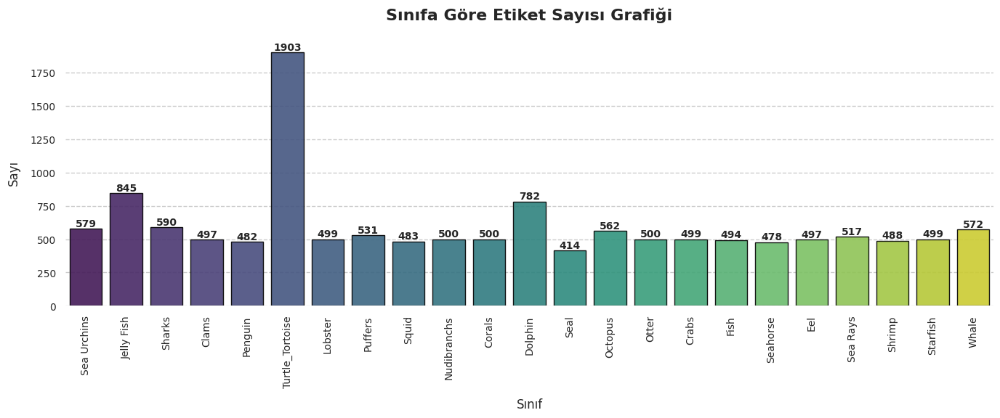

In [ ]:
src = os.listdir(dataset_path)
data = []
labels = src

for lb in src:
    x = os.path.join(dataset_path, lb)
    y = os.listdir(x)
    data.append(len(y))


plt.figure(figsize=(14, 6), dpi=100)


sns.set_style("whitegrid", {"grid.linestyle": "--", "grid.alpha": 0.7})
sns.set_context("notebook", font_scale=1.2)

barplot = sns.barplot(x=labels, y=data, hue=labels, palette="viridis", edgecolor="black", alpha=0.9, legend=False)

for i, v in enumerate(data):
    barplot.text(i, v + 0.5, str(v), ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.title("Sınıfa Göre Etiket Sayısı Grafiği", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Sınıf", fontsize=12, labelpad=10)
plt.ylabel("Sayı", fontsize=12, labelpad=10)

plt.xticks(rotation=90, ha='center', fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()

sns.despine(left=True, bottom=True)

plt.show()

### Görüntü Boyutu Analizi

In [ ]:
# Görüntü boyutlarını ve örnek görüntüleri toplamak için listeler
sizes = []
sample_images = []
sample_labels = []

# Sınıfları al
classes = [cls for cls in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, cls))]
print(f"Toplam sınıf sayısı: {len(classes)}")

# Tüm sınıfları ve görüntüleri tarama
for cls in tqdm(classes, desc="Sınıflar taranıyor"):
    class_path = os.path.join(dataset_path, cls)
    # Sınıf içindeki görüntüleri listele
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if images:  # Eğer sınıfta görüntü varsa
        # Rastgele bir görüntü seç (örnek görselleştirme için)
        selected_image = random.choice(images)
        sample_img_path = os.path.join(class_path, selected_image)

        try:
            # Örnek görüntüyü oku (BGR formatında)
            sample_img = cv2.imread(sample_img_path)
            if sample_img is not None:
                # BGR'yi RGB'ye çevir
                sample_img_rgb = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
                sample_images.append(sample_img_rgb)
                sample_labels.append(cls)
        except Exception as e:
            print(f"Hata: Örnek görüntü {sample_img_path} okunamadı. {str(e)}")

        # Tüm görüntülerin boyutlarını topla
        for img_name in images:
            img_path = os.path.join(class_path, img_name)
            try:
                # Görüntüyü oku
                img = cv2.imread(img_path)
                if img is not None:
                    # Boyutları al (yükseklik, genişlik)
                    h, w = img.shape[:2]
                    sizes.append((w, h))  # (genişlik, yükseklik) tuple'ı olarak kaydet
            except Exception as e:
                print(f"Hata: {img_path} okunamadı. {str(e)}")
    else:
        print(f"Uyarı: {cls} sınıfında görüntü bulunamadı.")

# 1. Görüntü boyutlarının analizi ve tablo görselleştirme
size_counts = Counter(sizes)
data = [[f"{w}x{h}", count] for (w, h), count in size_counts.items()]
data.sort(key=lambda x: x[1], reverse=True)  # Frekansa göre sırala (büyükten küçüğe)

# Tabloyu görselleştir
table = tabulate(data, headers=["Boyut (Genişlik x Yükseklik)", "Görüntü Sayısı"], tablefmt="fancy_grid")
print("\nGörüntü Boyutları Tablosu:")
print(table)

# Boyutların benzersizliğini kontrol et
unique_sizes = set(sizes)
print(f"\nBenzersiz görüntü boyutları: {len(unique_sizes)} farklı boyut")
if len(unique_sizes) > 1:
    print("Görüntüler farklı boyutlarda.")
else:
    print("Tüm görüntüler aynı boyutta.")



Toplam sınıf sayısı: 23


Sınıflar taranıyor: 100%|██████████| 23/23 [00:07<00:00,  2.89it/s]


Görüntü Boyutları Tablosu:
╒════════════════════════════════╤══════════════════╕
│ Boyut (Genişlik x Yükseklik)   │   Görüntü Sayısı │
╞════════════════════════════════╪══════════════════╡
│ 300x225                        │             4063 │
├────────────────────────────────┼──────────────────┤
│ 300x200                        │             3931 │
├────────────────────────────────┼──────────────────┤
│ 300x199                        │              566 │
├────────────────────────────────┼──────────────────┤
│ 225x300                        │              528 │
├────────────────────────────────┼──────────────────┤
│ 300x169                        │              398 │
├────────────────────────────────┼──────────────────┤
│ 300x201                        │              316 │
├────────────────────────────────┼──────────────────┤
│ 200x300                        │              303 │
├────────────────────────────────┼──────────────────┤
│ 300x300                        │              282 │


### Duplicate Görüntü Analizi


Duplicate görüntüleri tespit ediliyor...
Toplam 13711 görüntü taranacak


Hash hesaplanıyor: 100%|██████████| 13711/13711 [00:24<00:00, 558.52it/s]



Yakın benzerlikte olanları tespit ediliyor...


100%|██████████| 13593/13593 [04:39<00:00, 48.56it/s]  



Toplam 98 tam duplicate grup bulundu.
Toplam 22 yakın benzerlikte grup bulundu.

Tam duplicate görüntüler görselleştiriliyor...


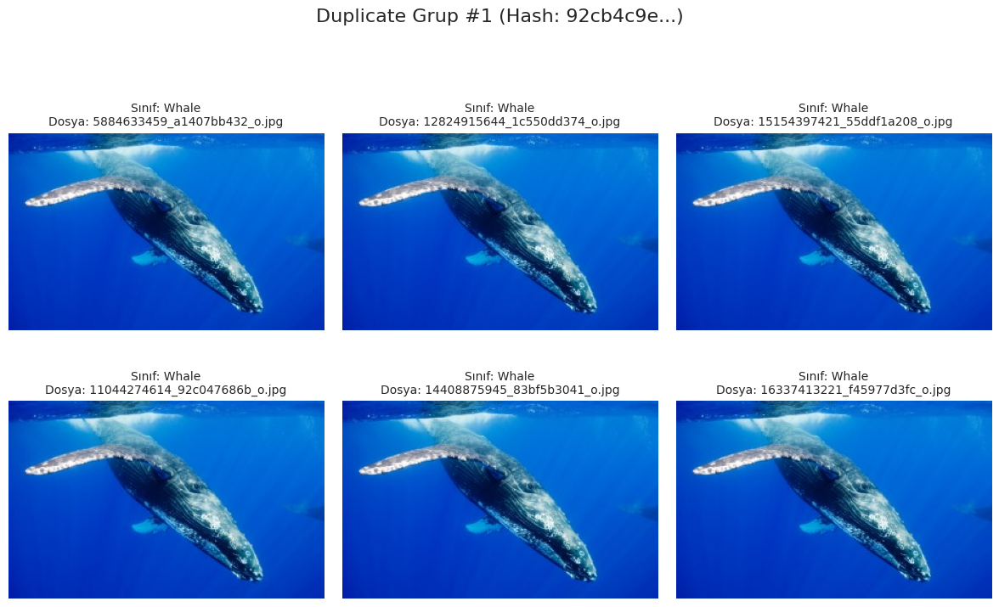

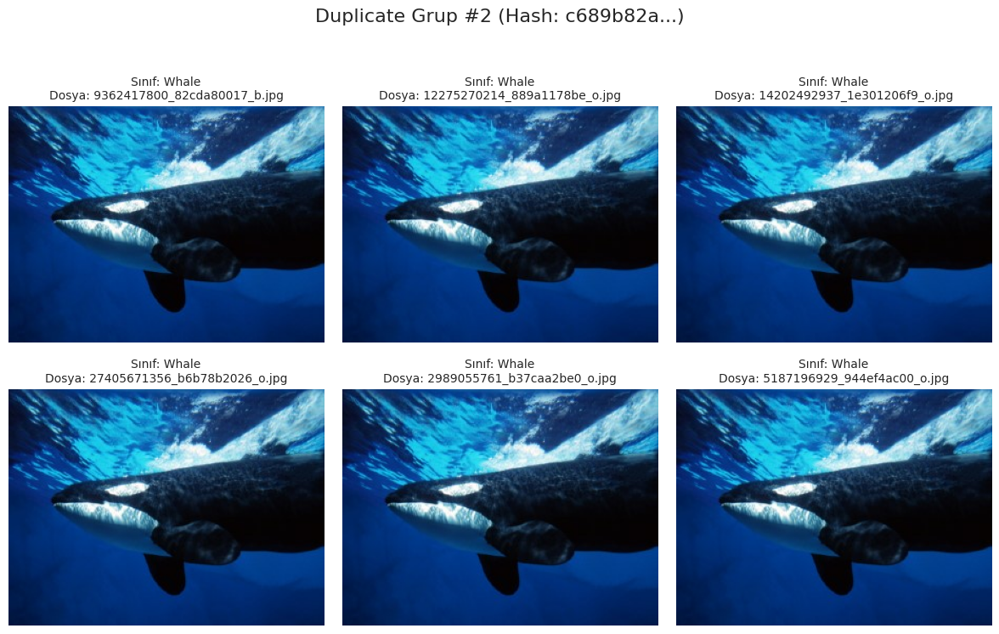

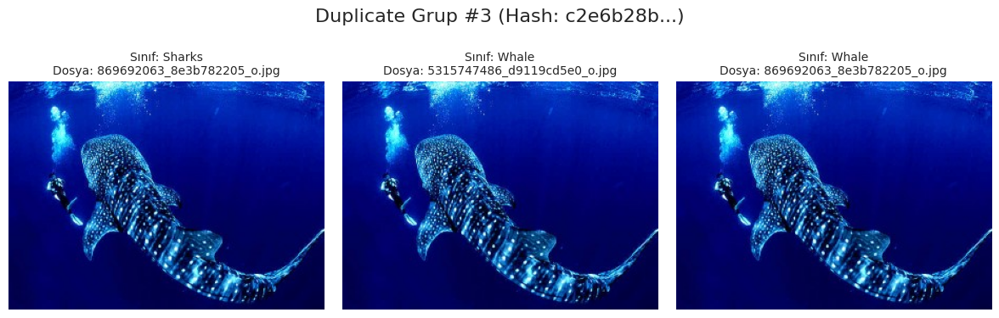

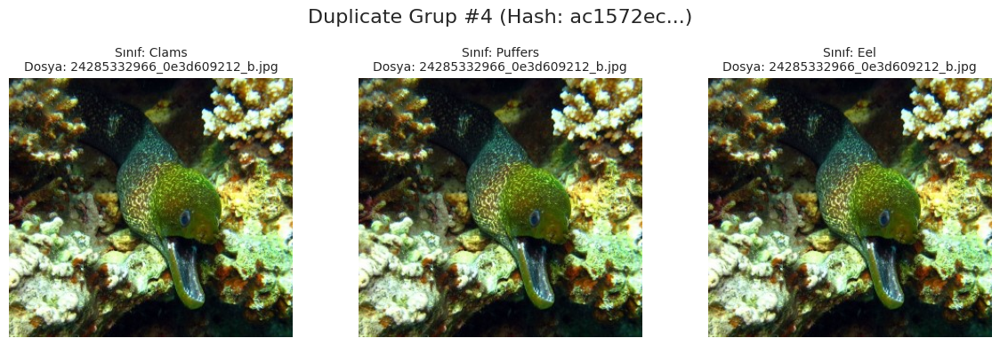

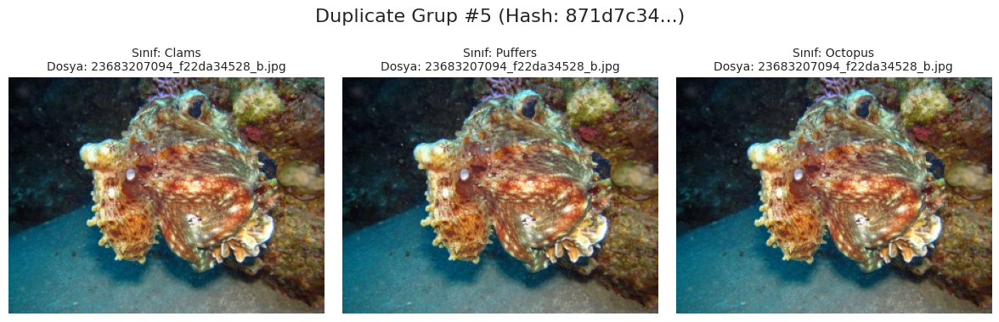

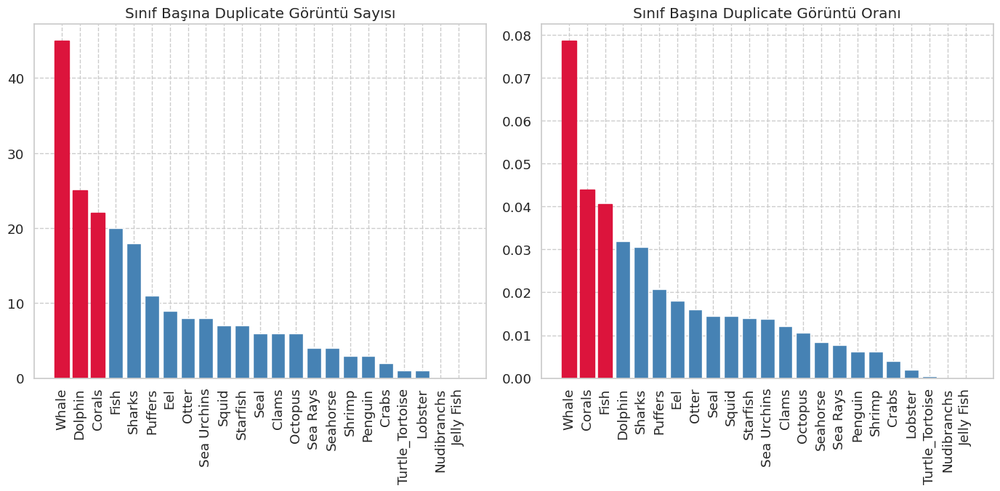


Toplam tespit edilen duplicate görüntü sayısı: 118
En çok duplicate içeren sınıflar:
  - Whale: 45 duplicate (7.87%)
  - Corals: 22 duplicate (4.40%)
  - Fish: 20 duplicate (4.05%)


In [ ]:
def find_duplicate_images(dataset_path, hash_size=8, threshold=5):
    """
    Veri setindeki benzer görüntüleri perceptual hash kullanarak tespit eder

    Args:
        dataset_path (str): Veri seti dizini
        hash_size (int): Perceptual hash boyutu
        threshold (int): Benzerlik eşik değeri (0-64 arası, düşük değer daha katı eşleşme)

    Returns:
        dict: Benzer görüntüler sözlüğü
    """
    print("\nDuplicate görüntüleri tespit ediliyor...")

    # Hash'leri saklamak için sözlük
    hashes = {}
    duplicates = defaultdict(list)

    image_paths = []
    classes = os.listdir(dataset_path)

    for cls in classes:
        class_path = os.path.join(dataset_path, cls)
        if os.path.isdir(class_path):
            for img_name in os.listdir(class_path):
                if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(class_path, img_name)
                    image_paths.append((img_path, cls))

    print(f"Toplam {len(image_paths)} görüntü taranacak")

    # Hash'leri hesapla
    for img_path, cls in tqdm(image_paths, desc="Hash hesaplanıyor"):
        try:
            img = Image.open(img_path)
            h = imagehash.phash(img, hash_size=hash_size)

            if h in hashes:
                duplicates[str(h)].append((img_path, cls))
            else:
                hashes[h] = (img_path, cls)
                duplicates[str(h)] = [(img_path, cls)]

        except Exception as e:
            print(f"Hata: {img_path} işlenemedi. {e}")

    # Sadece duplicate olanları filtrele
    duplicates = {k: v for k, v in duplicates.items() if len(v) > 1}

    near_duplicates = defaultdict(list)
    hash_keys = list(hashes.keys())

    print("\nYakın benzerlikte olanları tespit ediliyor...")
    for i in tqdm(range(len(hash_keys))):
        for j in range(i + 1, len(hash_keys)):
            h1 = hash_keys[i]
            h2 = hash_keys[j]
            # Hamming mesafesi ile benzerlik kontrolü
            if h1 - h2 <= threshold:
                img1 = hashes[h1]
                img2 = hashes[h2]
                group_id = f"similar_{i}_{j}"
                near_duplicates[group_id].append(img1)
                near_duplicates[group_id].append(img2)

    return duplicates, near_duplicates

def visualize_duplicates(duplicates, max_groups=5, max_images_per_group=6):
    """
    Tespit edilen duplicate görüntüleri görselleştirir

    Args:
        duplicates (dict): Duplicate görüntüler sözlüğü
        max_groups (int): Görselleştirilecek maksimum grup sayısı
        max_images_per_group (int): Her grupta gösterilecek maksimum görüntü sayısı
    """
    sorted_groups = sorted(duplicates.items(), key=lambda x: len(x[1]), reverse=True)

    for i, (hash_val, images) in enumerate(sorted_groups[:max_groups]):
        if len(images) < 2:
            continue

        images = images[:max_images_per_group]
        n_images = len(images)

        # Plot boyutunu ayarla
        n_cols = min(3, n_images)
        n_rows = (n_images + n_cols - 1) // n_cols

        plt.figure(figsize=(n_cols * 4, n_rows * 4))
        plt.suptitle(f'Duplicate Grup #{i+1} (Hash: {hash_val[:8]}...)', fontsize=16)

        for j, (img_path, cls) in enumerate(images):
            plt.subplot(n_rows, n_cols, j + 1)
            try:
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                plt.imshow(img)
                plt.title(f"Sınıf: {cls}\nDosya: {os.path.basename(img_path)}", fontsize=10)
                plt.axis('off')
            except Exception as e:
                plt.text(0.5, 0.5, f"Görüntü yüklenemedi: {e}",
                         ha='center', va='center', fontsize=10)

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

def analyze_duplicate_distribution(duplicates, dataset_path):
    """
    Duplicate görüntülerin dağılımını analiz eder

    Args:
        duplicates (dict): Duplicate görüntüler sözlüğü
        dataset_path (str): Veri seti dizini
    """
    # Sınıf başına duplicate sayısı
    class_duplicates = defaultdict(int)
    total_duplicates = 0

    for hash_val, images in duplicates.items():
        if len(images) > 1:
            # Bu gruptaki duplicate sayısı (grup boyutu - 1)
            dup_count = len(images) - 1
            total_duplicates += dup_count

            # Sınıflara göre duplicate dağılımını hesapla
            for img_path, cls in images:
                class_duplicates[cls] += 1

    # Sınıf başına toplam görüntü sayısını hesapla
    class_totals = defaultdict(int)
    for cls in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, cls)
        if os.path.isdir(class_path):
            class_totals[cls] = len([f for f in os.listdir(class_path)
                                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))])

    # Duplicate oranlarını hesapla
    class_duplicate_rates = {}
    for cls in class_totals:
        class_duplicate_rates[cls] = class_duplicates[cls] / max(1, class_totals[cls])

    # Sonuçları görselleştir
    plt.figure(figsize=(14, 7))

    # Duplicate sayısı grafiği
    plt.subplot(1, 2, 1)
    classes = list(class_totals.keys())
    dup_counts = [class_duplicates[cls] for cls in classes]

    # En çok duplicate içerenden başlayarak sırala
    sorted_idx = np.argsort(dup_counts)[::-1]
    classes = [classes[i] for i in sorted_idx]
    dup_counts = [dup_counts[i] for i in sorted_idx]

    bars = plt.bar(classes, dup_counts, color='steelblue')
    plt.xticks(rotation=90)
    plt.title('Sınıf Başına Duplicate Görüntü Sayısı')
    plt.tight_layout()

    for i, (c, v) in enumerate(zip(classes, dup_counts)):
        if i < 3:
            bars[i].set_color('crimson')

    # Duplicate oranı grafiği
    plt.subplot(1, 2, 2)
    classes = list(class_duplicate_rates.keys())
    dup_rates = [class_duplicate_rates[cls] for cls in classes]

    # En yüksek orandan başlayarak sırala
    sorted_idx = np.argsort(dup_rates)[::-1]
    classes = [classes[i] for i in sorted_idx]
    dup_rates = [dup_rates[i] for i in sorted_idx]

    bars = plt.bar(classes, dup_rates, color='steelblue')
    plt.xticks(rotation=90)
    plt.title('Sınıf Başına Duplicate Görüntü Oranı')
    plt.tight_layout()

    for i, (c, v) in enumerate(zip(classes, dup_rates)):
        if i < 3:
            bars[i].set_color('crimson')

    plt.tight_layout()
    plt.show()

    print(f"\nToplam tespit edilen duplicate görüntü sayısı: {total_duplicates}")
    print(f"En çok duplicate içeren sınıflar:")
    for cls in classes[:3]:
        print(f"  - {cls}: {class_duplicates[cls]} duplicate ({class_duplicate_rates[cls]:.2%})")

def remove_exact_duplicates(duplicates, backup_dir=None):
    """
    Tam duplicate olan görüntüleri siler veya yedekler

    Args:
        duplicates (dict): Tam duplicate görüntüler sözlüğü
        backup_dir (str, optional): Yedekleme dizini. Eğer belirtilirse, duplicatelar silinmek
                                   yerine bu dizine taşınır.

    Returns:
        int: Silinen veya taşınan görüntü sayısı
    """
    removed_count = 0

    # Backup dizini oluştur
    if backup_dir:
        os.makedirs(backup_dir, exist_ok=True)
        print(f"\nDuplicate görüntüler '{backup_dir}' dizinine taşınacak.")
    else:
        print("\nDuplicate görüntüler kalıcı olarak silinecek!")
        confirmation = input("Devam etmek istiyor musunuz? (e/h): ")
        if confirmation.lower() != 'e':
            print("İşlem iptal edildi.")
            return 0

    print("\nTam duplicate görüntüler temizleniyor...")

    for hash_val, images in tqdm(duplicates.items(), desc="Duplicate temizleniyor"):
        if len(images) > 1:
            # İlk görüntüyü koru, diğerlerini sil veya taşı
            for img_path, cls in images[1:]:
                try:
                    if backup_dir:
                        class_backup_dir = os.path.join(backup_dir, cls)
                        os.makedirs(class_backup_dir, exist_ok=True)

                        filename = os.path.basename(img_path)
                        backup_path = os.path.join(class_backup_dir, filename)

                        if os.path.exists(backup_path):
                            base, ext = os.path.splitext(filename)
                            backup_path = os.path.join(class_backup_dir, f"{base}_dup_{removed_count}{ext}")

                        os.rename(img_path, backup_path)

                    else:
                        os.remove(img_path)

                    removed_count += 1

                except Exception as e:
                    print(f"Hata: {img_path} işlenemedi. {e}")

    return removed_count

hash_size = 8
threshold = 5

duplicates, near_duplicates = find_duplicate_images(dataset_path, hash_size=hash_size, threshold=threshold)

print(f"\nToplam {len(duplicates)} tam duplicate grup bulundu.")
print(f"Toplam {len(near_duplicates)} yakın benzerlikte grup bulundu.")

    # Tam duplicate olanları görselleştir
print("\nTam duplicate görüntüler görselleştiriliyor...")
visualize_duplicates(duplicates, max_groups=5, max_images_per_group=6)

    # Dağılım analizini yap
analyze_duplicate_distribution(duplicates, dataset_path)

### Örnek Görüntüler

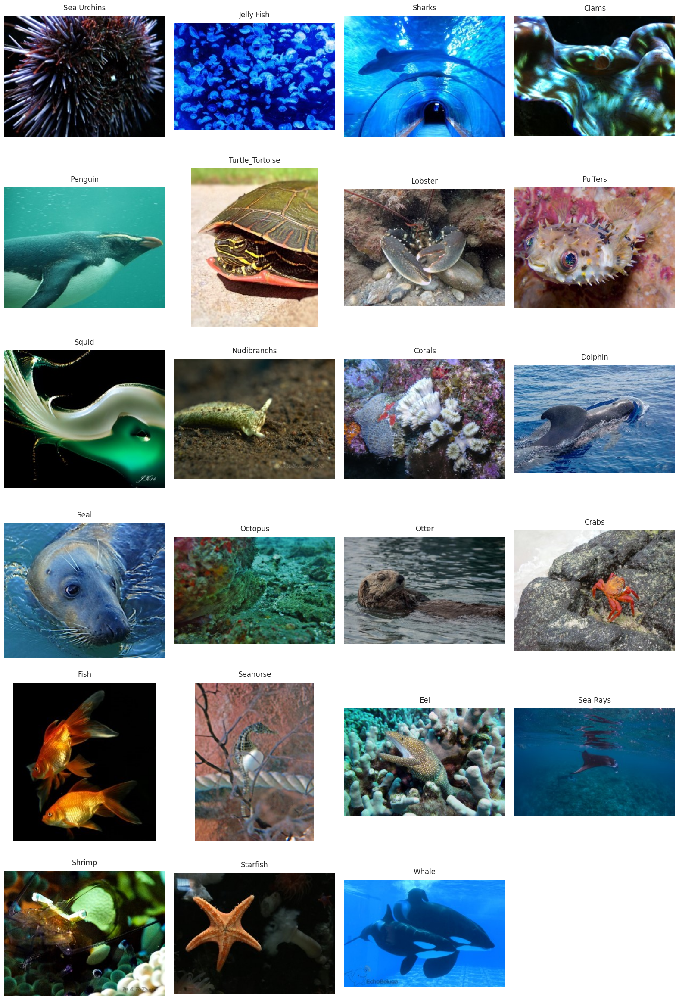

In [ ]:
n_cols = 4
n_rows = (len(sample_images) + n_cols - 1) // n_cols

plt.figure(figsize=(n_cols * 4, n_rows * 4))

for i, (img, label) in enumerate(zip(sample_images, sample_labels)):
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(img)
    plt.title(label, fontsize=12, pad=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

## Ön İşleme

### Duplicate Görüntülerin Temizlenmesi

In [ ]:
removed_count = remove_exact_duplicates(duplicates)
print(f"\nToplam {removed_count} tam duplicate görüntü silindi.")


Duplicate görüntüler kalıcı olarak silinecek!
Devam etmek istiyor musunuz? (e/h): e

Tam duplicate görüntüler temizleniyor...


Duplicate temizleniyor: 100%|██████████| 98/98 [00:00<00:00, 24975.20it/s]


Toplam 118 tam duplicate görüntü silindi.


### Train,Val ve Test Setlerine Ayırma

In [ ]:
output_path = '/content/dataset'

if not os.path.exists(output_path):
    os.mkdir(output_path)

for label in labels:
    new_path = os.path.join(dataset_path, label)

    label_path = os.listdir(new_path)
    imgs = [i for i in label_path if i.endswith(".jpg")]

    random.shuffle(imgs)

    train_split = 0.75
    val_split = 0.15
    # test_split = 0.10

    total_len = len(imgs)
    train_len = int(total_len * train_split)
    val_len = int(total_len * val_split)

    train_imgs = imgs[:train_len]
    val_imgs = imgs[train_len:train_len + val_len]
    test_imgs = imgs[train_len + val_len:]

    train_path = os.path.join(output_path, "train")
    label_train_path = os.path.join(train_path, label)

    val_path = os.path.join(output_path, "val")
    label_val_path = os.path.join(val_path, label)

    test_path = os.path.join(output_path, "test")
    label_test_path = os.path.join(test_path, label)

    if not os.path.exists(train_path):
        os.mkdir(train_path)
    if not os.path.exists(label_train_path):
        os.mkdir(label_train_path)

    if not os.path.exists(val_path):
        os.mkdir(val_path)
    if not os.path.exists(label_val_path):
        os.mkdir(label_val_path)

    if not os.path.exists(test_path):
        os.mkdir(test_path)
    if not os.path.exists(label_test_path):
        os.mkdir(label_test_path)

    for img in train_imgs:
        shutil.copy(os.path.join(new_path, img), label_train_path)

    for img in val_imgs:
        shutil.copy(os.path.join(new_path, img), label_val_path)

    for img in test_imgs:
        shutil.copy(os.path.join(new_path, img), label_test_path)

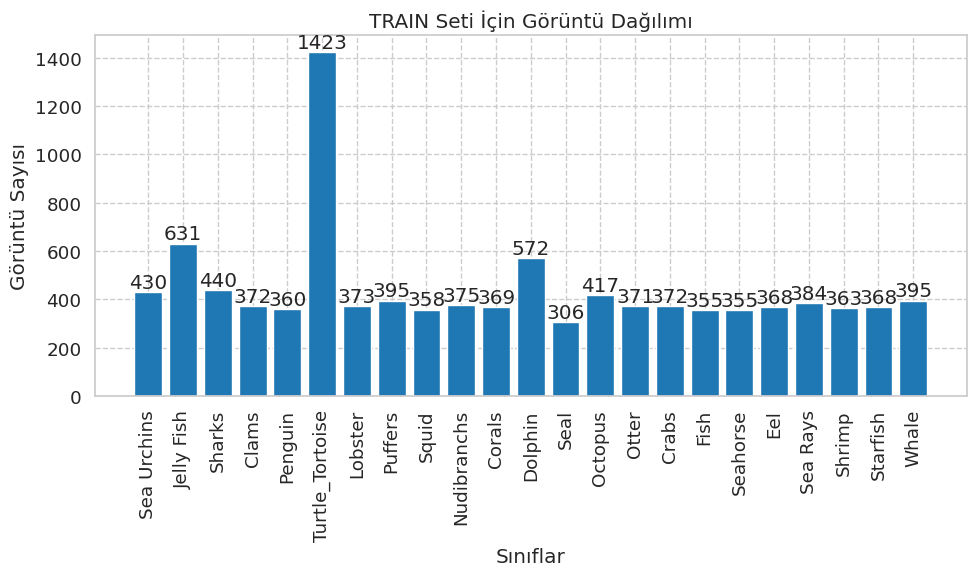

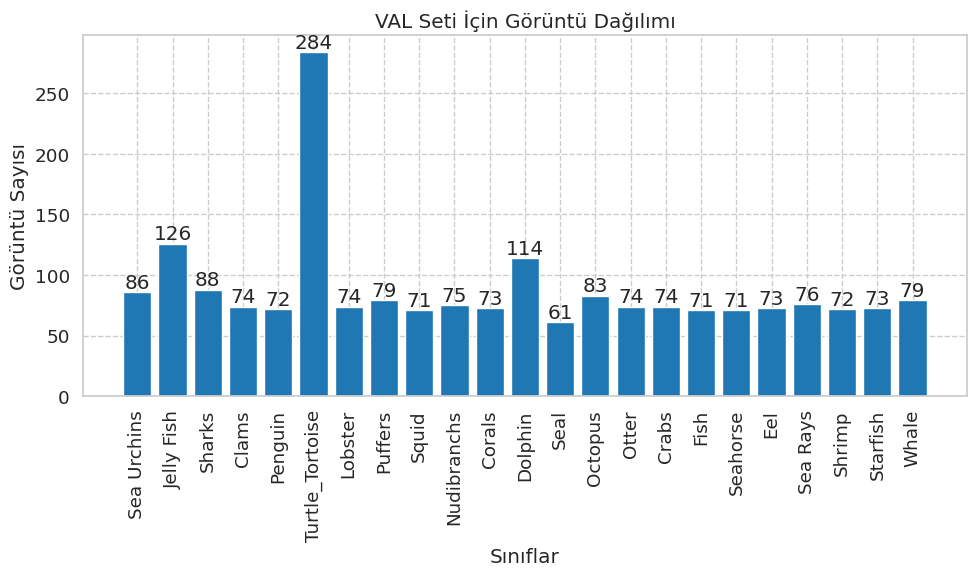

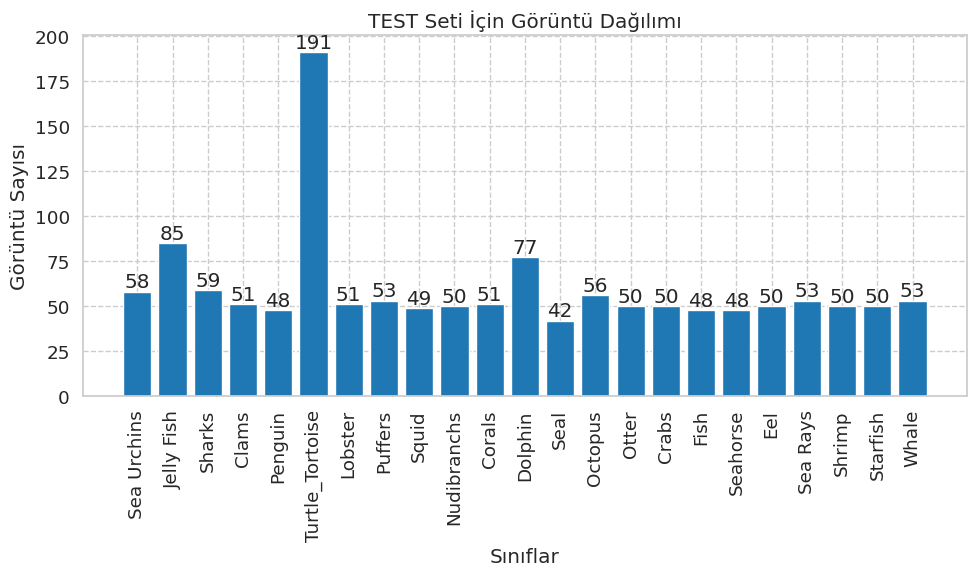

In [ ]:
output_path = '/content/dataset'
splits = ['train', 'val', 'test']

image_counts = {split: {} for split in splits}

#Setlerdeki sınıfların sahip oldukları görüntü miktarını bulma
for split in splits:
    split_path = os.path.join(output_path, split)
    if os.path.exists(split_path):
        for label in os.listdir(split_path):
            label_path = os.path.join(split_path, label)
            if os.path.isdir(label_path):
                image_counts[split][label] = len([f for f in os.listdir(label_path) if f.endswith('.jpg')])


# Her set için görüntü dağılımı grafiği oluşturma
for split in splits:
    if image_counts[split]:
        plt.figure(figsize=(10, 6))
        labels = list(image_counts[split].keys())
        counts = list(image_counts[split].values())

        bars = plt.bar(labels, counts)
        plt.title(f'{split.upper()} Seti İçin Görüntü Dağılımı')
        plt.xlabel('Sınıflar')
        plt.ylabel('Görüntü Sayısı')
        plt.xticks(rotation=90)

        for bar in bars:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2., height,
                    f'{int(height)}',
                    ha='center', va='bottom')

        plt.tight_layout()
        plt.show()

In [ ]:
INPUT_SIZE = (227,227)
train_dataset_url = train_path
train_data_dir = pathlib.Path(train_dataset_url)

validation_dataset_url = val_path
validation_data_dir = pathlib.Path(validation_dataset_url)

test_dataset_url = test_path
test_data_dir = pathlib.Path(test_dataset_url)

img_height,img_width= INPUT_SIZE
batch_size=32

#Train
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  train_data_dir,
  seed=42,
  image_size=(img_height, img_width),
  batch_size=batch_size)

#Validation
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  validation_data_dir,
  seed=42,
  image_size=(img_height, img_width),
  batch_size=batch_size)

#Test
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_data_dir,
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 10152 files belonging to 23 classes.
Found 2023 files belonging to 23 classes.
Found 1373 files belonging to 23 classes.


### Augmentation Uygulanması

In [12]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array, save_img


# Veri artırma katmanı
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.08),
    tf.keras.layers.RandomZoom(0.12),
    tf.keras.layers.RandomContrast(0.15),
    tf.keras.layers.RandomBrightness(factor=0.15),
    tf.keras.layers.RandomTranslation(0.08, 0.08),
])

# Augmentation fonksiyonu
def Augmentation(path, target_count=1600, target_size=(227, 227), batch_size=16):
    data_dir = pathlib.Path(path)
    labels = [label.name for label in data_dir.iterdir() if label.is_dir()]
    print(f"Sınıflar: {labels}")

    for label in labels:
        image_directory = os.path.join(path, label)
        print(f"\nİşlenen klasör: {image_directory}")
        output_directory = os.path.join(path, label)
        os.makedirs(output_directory, exist_ok=True)

        dataset = []
        my_images = os.listdir(image_directory)
        for image_name in my_images:
            if image_name.endswith('.jpg'):
                image_path = os.path.join(image_directory, image_name)
                try:
                    image = load_img(image_path, target_size=target_size)
                    image = img_to_array(image)
                    dataset.append(image)
                except Exception as e:
                    print(f"Hata: {image_path} yüklenemedi. {e}")

        if not dataset:
            print(f"{label} sınıfında uygun görüntü bulunamadı.")
            continue

        current_count = len(dataset)
        print(f"{label} sınıfında {current_count} görüntü yüklendi.")

        if label == 'Turtle_Tortoise':
            print(f"{label} sınıfı atlanıyor (yeterli görüntü: {current_count}).")
            continue

        images_needed = target_count - current_count
        if images_needed <= 0:
            print(f"{label} sınıfında yeterli görüntü var ({current_count}). Artırma gerekmiyor.")
            _______________
            print(f"{label} için {images_needed} artırılmış görüntü üretilecek.")
        x = np.array(dataset)
        dataset = tf.data.Dataset.from_tensor_slices(x).batch(batch_size).repeat()

        i = 0
        for batch in dataset:
            augmented_images = data_augmentation(batch, training=True)
            for j, aug_image in enumerate(augmented_images):
                if i >= images_needed:
                    break
                output_path = os.path.join(output_directory, f'aug_{i}.jpg')
                save_img(output_path, aug_image)
                i += 1
            if i >= images_needed:
                break

        print(f"{label} sınıfı için {i} artırılmış görüntü kaydedildi.")
        print(f"{label} sınıfında toplam {current_count + i} görüntü var.")


target_count = 1000
target_size = (227, 227)
batch_size = 16

Augmentation(train_path, target_count=target_count, target_size=target_size, batch_size=batch_size)

Sınıflar: ['Sea Urchins', 'Jelly Fish', 'Sharks', 'Clams', 'Penguin', 'Turtle_Tortoise', 'Lobster', 'Puffers', 'Squid', 'Nudibranchs', 'Corals', 'Dolphin', 'Seal', 'Octopus', 'Otter', 'Crabs', 'Fish', 'Seahorse', 'Eel', 'Sea Rays', 'Shrimp', 'Starfish', 'Whale']

İşlenen klasör: /content/dataset/train/Sea Urchins
Sea Urchins sınıfında 430 görüntü yüklendi.
Sea Urchins sınıfı için 570 artırılmış görüntü kaydedildi.
Sea Urchins sınıfında toplam 1000 görüntü var.

İşlenen klasör: /content/dataset/train/Jelly Fish
Jelly Fish sınıfında 631 görüntü yüklendi.
Jelly Fish sınıfı için 369 artırılmış görüntü kaydedildi.
Jelly Fish sınıfında toplam 1000 görüntü var.

İşlenen klasör: /content/dataset/train/Sharks
Sharks sınıfında 440 görüntü yüklendi.
Sharks sınıfı için 560 artırılmış görüntü kaydedildi.
Sharks sınıfında toplam 1000 görüntü var.

İşlenen klasör: /content/dataset/train/Clams
Clams sınıfında 372 görüntü yüklendi.
Clams sınıfı için 628 artırılmış görüntü kaydedildi.
Clams sınıfında to

## Model Eğitimleri

### EfficientNetB3

In [ ]:
# --- Configuration ---
dataset_dir = './archive'  # Dataset path
output_dir = './sea animals'    # Where to save the split dataset
split_ratio = [0.75, 0.1, 0.15]   # Train, Val, Test split
random.seed(42)

# --- Create output folders ---
for split in ['train', 'val', 'test']:
    for class_name in os.listdir(dataset_dir):
        class_path = os.path.join(dataset_dir, class_name)
        if os.path.isdir(class_path):  # Ensure it's a folder
            os.makedirs(os.path.join(output_dir, split, class_name), exist_ok=True)

# --- Process each class folder ---
for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if not images:
        continue

    # Split into train, val, and test
    train_imgs, temp_imgs = train_test_split(images, test_size=(1 - split_ratio[0]), random_state=42)
    val_imgs, test_imgs = train_test_split(temp_imgs, test_size=split_ratio[2]/(split_ratio[1] + split_ratio[2]), random_state=42)

    # Copy files to respective folders
    for img_name in train_imgs:
        shutil.copy(os.path.join(class_path, img_name), os.path.join(output_dir, 'train', class_name, img_name))
    for img_name in val_imgs:
        shutil.copy(os.path.join(class_path, img_name), os.path.join(output_dir, 'val', class_name, img_name))
    for img_name in test_imgs:
        shutil.copy(os.path.join(class_path, img_name), os.path.join(output_dir, 'test', class_name, img_name))

print("Dataset split completed successfully!")

Dataset split completed successfully!


In [3]:
import tensorflow as tf

INPUT_SIZE = (300, 300)

# Load training dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    "data/train",
    shuffle=True,
    image_size=INPUT_SIZE,
    label_mode='int'  # labels as indices
)

# Load validation dataset
#val_ds = tf.keras.utils.image_dataset_from_directory(
#    "sea animals/val",
#    shuffle=False,
#    image_size=INPUT_SIZE,
#    label_mode='int'
#)

# Load test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
    "data/test",
    shuffle=False,
    image_size=INPUT_SIZE,
    label_mode='int'
)

Found 10961 files belonging to 23 classes.
Found 2750 files belonging to 23 classes.


In [ ]:
preprocess = tf.keras.Sequential([  layers.Rescaling(1./255)])

In [ ]:
base_model = tf.keras.applications.EfficientNetB3(
weights='imagenet',
include_top=False,
input_shape=(INPUT_SIZE[0], INPUT_SIZE[1], 3)
)
for layer in base_model.layers[:len(base_model.layers)-4]:
    layer.trainable = False

![EfficientNetB3](https://www.researchgate.net/publication/359449935/figure/fig2/AS:1179981350744115@1658340885857/Schematic-representation-of-EfficientNet-B3.png)

In [ ]:
inputs = base_model.input
x = preprocess(inputs)
x = layers.GlobalAveragePooling2D()(base_model.output)
x = layers.Dense(32, activation='relu')(x)
x = layers.Dropout(0.1)(x)
outputs = layers.Dense(23, activation='softmax')(x)

model = models.Model(inputs, outputs)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy']) # SparseCategoricalAccuracy

model.summary()

In [ ]:
checkpoint_path = "./checkpoints/efficientnetb3_checkpoint.weights.h5"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)
early_stopping = EarlyStopping(monitor = "val_loss",
                               patience = 3,
                               restore_best_weights = True)

In [ ]:
history = model.fit(
train_ds,
validation_data=val_ds,
epochs=25,
callbacks=[early_stopping, checkpoint_callback]
)

Epoch 1/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 91s 229ms/step - accuracy: 0.4807 - loss: 2.0840 - val_accuracy: 0.8269 - val_loss: 0.7217
Epoch 2/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 185ms/step - accuracy: 0.8180 - loss: 0.7486 - val_accuracy: 0.8532 - val_loss: 0.5517
Epoch 3/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 186ms/step - accuracy: 0.8444 - loss: 0.5818 - val_accuracy: 0.8576 - val_loss: 0.5088
Epoch 4/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 185ms/step - accuracy: 0.8596 - loss: 0.5072 - val_accuracy: 0.8634 - val_loss: 0.4858
Epoch 5/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 187ms/step - accuracy: 0.8719 - loss: 0.4703 - val_accuracy: 0.8641 - val_loss: 0.4715
Epoch 6/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 186ms/step - accuracy: 0.8839 - loss: 0.4264 - val_accuracy: 0.8663 - val_loss: 0.4594
Epoch 7/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 186ms/step - accuracy: 0.8950 - loss: 0.3921 - val_accuracy: 0.8700 - val_loss: 0.4520
Epoch 8/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - accuracy: 0.8975 - loss: 0.3650 - val_accuracy: 0.8685 - val_loss: 0.4459
Epoch 9/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 187ms/step - accuracy: 0.9053 - loss: 0.3388 - val_accuracy: 0.8722 - val_loss: 0.4412
Epoch 10/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - accuracy: 0.9116 - loss: 0.3176 - val_accuracy: 0.8700 - val_loss: 0.4440
Epoch 11/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 186ms/step - accuracy: 0.9168 - loss: 0.3041 - val_accuracy: 0.8729 - val_loss: 0.4396
Epoch 12/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - accuracy: 0.9206 - loss: 0.2778 - val_accuracy: 0.8714 - val_loss: 0.4385
Epoch 13/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 184ms/step - accuracy: 0.9230 - loss: 0.2713 - val_accuracy: 0.8729 - val_loss: 0.4413
Epoch 14/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 187ms/step - accuracy: 0.9273 - loss: 0.2567 - val_accuracy: 0.8744 - val_loss: 0.4378
Epoch 15/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 184ms/step - accuracy: 0.9328 - loss: 0.2369 - val_accuracy: 0.8729 - val_loss: 0.4369
Epoch 16/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 186ms/step - accuracy: 0.9386 - loss: 0.2258 - val_accuracy: 0.8795 - val_loss: 0.4397
Epoch 17/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 184ms/step - accuracy: 0.9386 - loss: 0.2182 - val_accuracy: 0.8766 - val_loss: 0.4337
Epoch 18/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 60s 186ms/step - accuracy: 0.9396 - loss: 0.1971 - val_accuracy: 0.8839 - val_loss: 0.4357
Epoch 19/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - accuracy: 0.9481 - loss: 0.1858 - val_accuracy: 0.8802 - val_loss: 0.4355
Epoch 20/25


322/322 ━━━━━━━━━━━━━━━━━━━━ 59s 184ms/step - accuracy: 0.9481 - loss: 0.1872 - val_accuracy: 0.8780 - val_loss: 0.4526


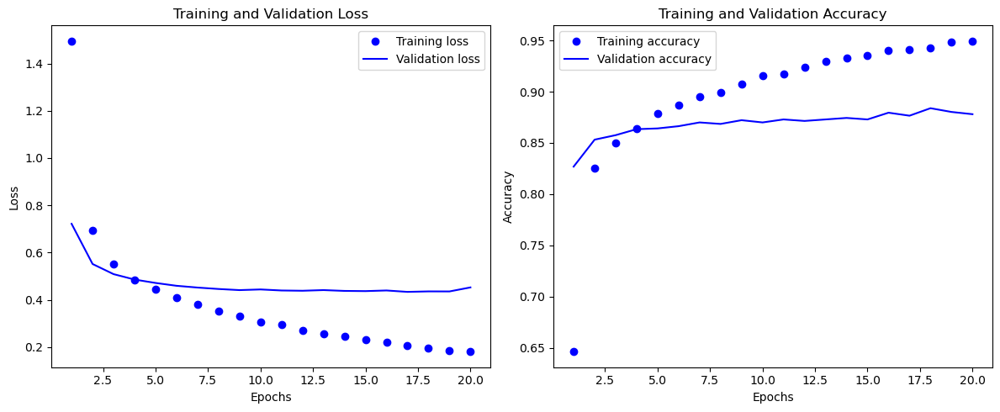

In [ ]:
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(loss_values)+1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot Loss
ax1.plot(epochs, loss_values, 'bo', label='Training loss')
ax1.plot(epochs, val_loss_values, 'b', label='Validation loss')
ax1.set_title('Training and Validation Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot Accuracy
ax2.plot(epochs, acc_values, 'bo', label='Training accuracy')
ax2.plot(epochs, val_acc_values, 'b', label='Validation accuracy')
ax2.set_title('Training and Validation Accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

plt.tight_layout()
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_ds)

print("Loss:", loss)
print("Accuracy:", accuracy)

65/65 ━━━━━━━━━━━━━━━━━━━━ 12s 191ms/step - accuracy: 0.8557 - loss: 0.5542
Loss: 0.4153333604335785
Accuracy: 0.8853965401649475


#### Grad-Cam Visualization

In [ ]:
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    # Save the superimposed image
    superimposed_img.save(cam_path)

    return cam_path

preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

last_conv_layer_name = "top_conv"
img_size = (INPUT_SIZE[0], INPUT_SIZE[1], 3)
# Remove last layer's softmax
model.layers[-1].activation = None

In [ ]:
import pandas as pd
import os

# Path to your dataset
test_dir = "./sea animals/test"

# Get class names (these will be used as labels)
class_names = test_ds.class_names

# Initialize lists to store the image data, labels, and file paths
images = []
image_paths = []

# Function to load image paths and corresponding labels
def load_image_paths_and_labels(directory):
    image_paths = []
    labels = []

    # Iterate through the directory structure to gather file paths and labels
    class_names = os.listdir(directory)
    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            for filename in os.listdir(class_path):
                if filename.endswith('.jpg') or filename.endswith('.png'):  # Adjust image types if necessary
                    image_paths.append(os.path.join(class_path, filename))
                    labels.append(class_name)  # Append the class name instead of index

    return image_paths, labels

# Get image paths and labels
image_paths, labels = load_image_paths_and_labels(test_dir)

# Iterate through the dataset to extract image data
for image_batch, _ in test_ds:
    images.append(image_batch.numpy())

# Flatten the images and convert to a single array
images = np.vstack(images).reshape(-1, np.prod(INPUT_SIZE) * 3)  # Flatten to 1D for each image

# Create a DataFrame with images, class names as labels, and file paths
test_df = pd.DataFrame(images)
test_df['label'] = labels
test_df['filepath'] = image_paths

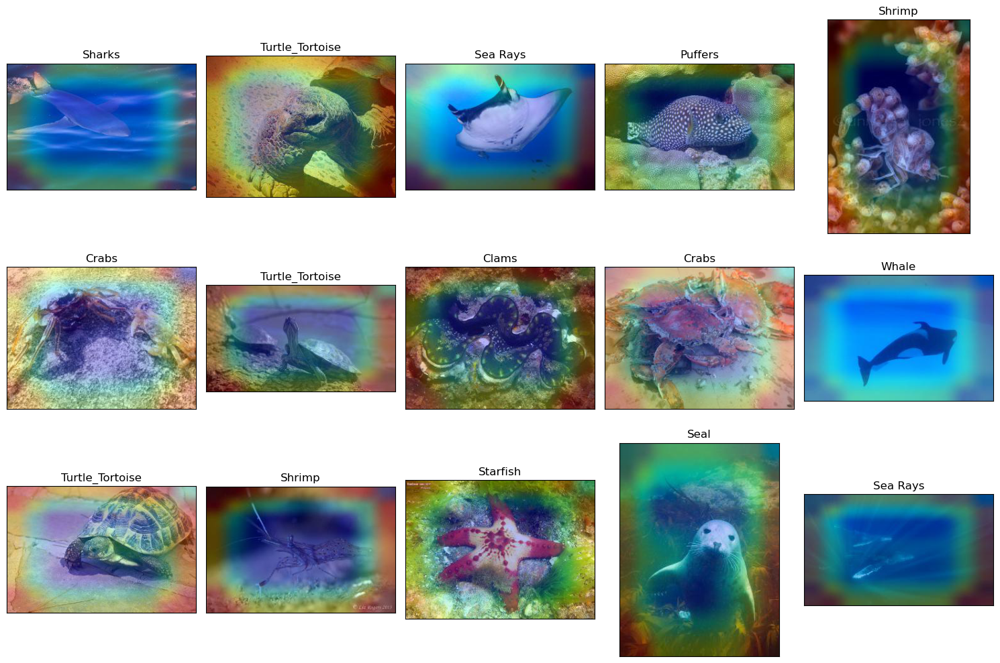

In [ ]:
random_index = np.random.randint(0, len(test_df), 16)
# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = test_df['filepath'].iloc[random_index[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    ax.set_title(test_df['label'].iloc[random_index[i]])
plt.tight_layout()
plt.show()

os.remove("cam.jpg")

## VGG16 Tabanlı Transfer Learning Modeli

Bu model, ImageNet üzerinde önceden eğitilmiş **VGG16** mimarisi üzerine inşa edilmiştir. VGG16 modelinin convolution katmanları dondurulmuş, yalnızca sondaki sınıflayıcı (dense) katmanlar eğitilmiştir.
Sıfırdan model eğitmek yerine, önceden öğrenilmiş görsel özniteliklerden faydalanarak daha hızlı ve daha kararlı bir sınıflandırıcı elde edilmesi amaçlanmıştır.

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models, Input

base_model = VGG16(
    weights='imagenet',
    include_top=False,  # FC katmanları dahil değil, sadece convolution
    input_shape=(300, 300, 3)
)

# İlk katmanları dondur (özellik çıkarıcı olarak kullan)
for layer in base_model.layers:
    layer.trainable = False

# Transfer learning üst mimarisi
inputs = Input(shape=(300, 300, 3))
x = layers.Rescaling(1./255)(inputs)  # Normalize
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(len(train_ds.class_names), activation='softmax')(x)

model = models.Model(inputs, outputs)

### Mimari
- **Taban model**: `VGG16(weights='imagenet', include_top=False)`
- **Girdi boyutu**: `300x300x3`
- **Ön işleme**: `Rescaling(1./255)`
- **Dondurulmuş katmanlar**: Tüm VGG16 conv katmanları (`trainable=False`)
- **Çıkış katmanları**:
  - `GlobalAveragePooling2D`  
  - `Dense(128, activation='relu')`
  - `Dropout(0.3)`
  - `Dense(23, activation='softmax')` 

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

opt = Adam(
    learning_rate=0.001,    # learn fast at start
    beta_1=0.9,       
    beta_2=0.999,
    epsilon=1e-07
)

model.compile(
    optimizer=opt,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

checkpoint_cb = ModelCheckpoint(
    filepath='./checkpoints/vgg_transfer_epoch{epoch:02d}.keras',
    save_weights_only=False,
    monitor='accuracy',
    save_best_only=True,
    verbose=1
)

early_stopping_cb = EarlyStopping(
    monitor='loss',
    patience=4,
    restore_best_weights=True,
    verbose=1
)

history = model.fit(
    train_ds,
    epochs=25,
    callbacks=[checkpoint_cb, early_stopping_cb]
)

### Eğitim
- **Optimizer**: `Adam(learning_rate=0.001, beta_1=0.9)`
- **Loss**: `sparse_categorical_crossentropy` (etiketler `int` formatında)
- **Metric**: `accuracy`
- **Epoch sayısı**: 25
- **EarlyStopping**: `monitor='loss'`, `patience=5`
- **Checkpoint**: Her epoch sonrası `.keras` dosyası olarak kayıt

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
from sklearn.metrics import classification_report

# Load the trained model
vgg_model = load_model('checkpoints/vgg_transfer_25.keras')

# Evaluate model on test set
test_loss, test_acc = vgg_model.evaluate(test_ds)
print(f"Test Accuracy: {test_acc:.2%}")
print(f"Test Loss: {test_loss:.4f}")

In [10]:
vgg_model = load_model('checkpoints/vgg_transfer_25.keras')

y_true = []
y_pred = []

for images, labels in test_ds:
    preds = vgg_model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

class_names = test_ds.class_names

report = classification_report(y_true, y_pred, target_names=class_names, digits=4)
print(report)

1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


KeyboardInterrupt: 

### Custom Model (CNN)

Bu model, 4 adet Conv2D bloğundan oluşur. Her blok sonrası BatchNormalization ve MaxPooling uygulanır.

- Girdi boyutu: 300x300x3
- Aktivasyon: Swish (ReLU'ya göre daha iyi performans)
- BatchNormalization: Katman çıktılarının dağılımını normalize ederek öğrenmeyi hızlandırır ve modelin genelleme kabiliyetini artırır.
- MaxPooling: Özellik haritalarının boyutunu azaltarak bilgi yoğunluğunu artırır ve hesaplama yükünü düşürür.
- Dense Katmanlar: `128 → 64` yapılandırması ile sınıflandırma başlığı oluşturulmuştur.
- Çıkış: Softmax ile 23 sınıf

In [ ]:
from tensorflow.keras import layers, models

NUM_CLASSES = len(train_ds.class_names)

model = models.Sequential([
    layers.Rescaling(1./255, input_shape=(300, 300, 3)),

    # Conv Block 1
    layers.Conv2D(32, (3, 3), activation='swish', padding='same'),
    layers.BatchNormalization(),

    # Conv Block 2
    layers.Conv2D(64, (3, 3), activation='swish', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    # Conv Block 3
    layers.Conv2D(128, (3, 3), activation='swish', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    # Conv Block 4
    layers.Conv2D(256, (3, 3), activation='swish', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),

    # Transition to Dense
    layers.GlobalAveragePooling2D(),

    layers.Dense(128, activation='swish'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),

    layers.Dense(64, activation='swish'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),

    layers.Dense(NUM_CLASSES, activation='softmax')
])


#### Custom Model Eğitimi

- `Adam` optimizörü kullanıldı
- Kayıp fonksiyonu: `sparse_categorical_crossentropy`
- Epoch sayısı: 30
- `beta_1`, geçmiş gradyanlara ağırlık vererek momentum etkisi sağlar
- Her epoch sonunda `.keras` formatında checkpoint kaydı yapılıyor.

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

optimizer = Adam(
    learning_rate=0.001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07
)

model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

checkpoint_cb = ModelCheckpoint(
    filepath='/content/drive/MyDrive/sea_animals_project/checkpoints/custom_cnn_epoch{epoch:02d}.keras',
    save_weights_only=False,
    monitor='accuracy',
    save_best_only=False,
    verbose=1
)

early_stopping_cb = EarlyStopping(
    monitor='loss',
    patience=4,
    restore_best_weights=True,
    verbose=1
)

history = model.fit(
    train_ds,
    epochs=30,
    callbacks=[checkpoint_cb, early_stopping_cb]
)


#### Custom Model Değerlendirmesi

- En iyi kayıtlı model (`epoch 30`) yüklenerek test verisi üzerinde değerlendirildi.
- **Test Accuracy**: %71.12  
- **Test Loss**: 0.9973
    değerleri alındı.

In [ ]:
from tensorflow.keras.models import load_model

custom_model = load_model('checkpoints/custom_cnn_epoch30.keras')

test_loss, test_acc = custom_model.evaluate(test_ds)
print(f"Test Accuracy: {test_acc:.2%}")
print(f"Test Loss: {test_loss:.4f}")

65/65 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.6574 - loss: 1.1501
Test Accuracy: 71.12%
Test Loss: 0.9973


In [12]:
from tensorflow.keras.models import load_model

custom_model = load_model('checkpoints/custom_cnn_epoch30.keras')

import numpy as np
from sklearn.metrics import classification_report

y_true = []
y_pred = []

for images, labels in test_ds:
    predictions = custom_model.predict(images, verbose=0)
    y_pred.extend(np.argmax(predictions, axis=1))
    y_true.extend(labels.numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

class_names = test_ds.class_names if hasattr(test_ds, 'class_names') else None
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

              precision    recall  f1-score   support

           0     0.4737    0.1800    0.2609       100
           1     0.4577    0.6500    0.5372       100
           2     0.5673    0.5900    0.5784       100
           3     0.6203    0.6242    0.6222       157
           4     0.3125    0.0500    0.0862       100
           5     0.4348    0.2020    0.2759        99
           6     0.7005    0.8166    0.7541       169
           7     0.5882    0.3000    0.3974       100
           8     0.3559    0.6300    0.4549       100
           9     0.2330    0.5752    0.3316       113
          10     0.7586    0.8800    0.8148       100
          11     0.5857    0.4227    0.4910        97
          12     0.7407    0.1869    0.2985       107
          13     0.3725    0.3654    0.3689       104
          14     0.7857    0.8534    0.8182       116
          15     0.3618    0.7500    0.4881        96
          16     0.5354    0.6386    0.5824        83
          17     0.4375    

### ResNet50

#### Callbacklerin Tanımlanması

In [13]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        filepath='best_resnet50_model.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.3,
        patience=4,
        min_lr=1e-6,
        verbose=1
    )
]


#### Modelin Derlenmesi

In [14]:
import tensorflow as tf
from tensorflow.keras import layers, models, applications

NUM_CLASSES = 23

base_model = applications.ResNet50(
    weights="imagenet",
    input_shape=(227, 227, 3),
    include_top=False
)
base_model.trainable = False

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),


    layers.Dense(512, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.5),

    layers.Dense(256, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(23, activation="softmax")
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 8, 8, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 23)             │         5,911 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,777,111 (94.52 MB)

 Trainable params: 1,187,863 (4.53 MB)

 Non-trainable params: 23,589,248 (89.99 MB)

#### Model Eğitimi

In [15]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=300,
    batch_size=32,
    callbacks=callbacks
)

Epoch 1/300
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.2277 - loss: 3.0370
Epoch 1: val_loss improved from inf to 1.21243, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 73s 174ms/step - accuracy: 0.2281 - loss: 3.0350 - val_accuracy: 0.6619 - val_loss: 1.2124 - learning_rate: 1.0000e-04
Epoch 2/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5617 - loss: 1.5186
Epoch 2: val_loss improved from 1.21243 to 0.96759, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step - accuracy: 0.5618 - loss: 1.5182 - val_accuracy: 0.7192 - val_loss: 0.9676 - learning_rate: 1.0000e-04
Epoch 3/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.6301 - loss: 1.2317
Epoch 3: val_loss improved from 0.96759 to 0.87498, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - accuracy: 0.6302 - loss: 1.2315 - val_accuracy: 0.7365 - val_loss: 0.8750 - learning_rate: 1.0000e-04
Epoch 4/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.6801 - loss: 1.0731
Epoch 4: val_loss improved from 0.87498 to 0.81882, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step - accuracy: 0.6801 - loss: 1.0731 - val_accuracy: 0.7528 - val_loss: 0.8188 - learning_rate: 1.0000e-04
Epoch 5/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7087 - loss: 0.9927
Epoch 5: val_loss improved from 0.81882 to 0.78018, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 46s 122ms/step - accuracy: 0.7087 - loss: 0.9926 - val_accuracy: 0.7677 - val_loss: 0.7802 - learning_rate: 1.0000e-04
Epoch 6/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7302 - loss: 0.8824
Epoch 6: val_loss improved from 0.78018 to 0.75416, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - accuracy: 0.7302 - loss: 0.8825 - val_accuracy: 0.7776 - val_loss: 0.7542 - learning_rate: 1.0000e-04
Epoch 7/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7462 - loss: 0.8410
Epoch 7: val_loss improved from 0.75416 to 0.73717, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - accuracy: 0.7462 - loss: 0.8410 - val_accuracy: 0.7830 - val_loss: 0.7372 - learning_rate: 1.0000e-04
Epoch 8/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7646 - loss: 0.7609
Epoch 8: val_loss improved from 0.73717 to 0.72397, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - accuracy: 0.7646 - loss: 0.7609 - val_accuracy: 0.7860 - val_loss: 0.7240 - learning_rate: 1.0000e-04
Epoch 9/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7806 - loss: 0.7208
Epoch 9: val_loss improved from 0.72397 to 0.71579, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - accuracy: 0.7806 - loss: 0.7209 - val_accuracy: 0.7929 - val_loss: 0.7158 - learning_rate: 1.0000e-04
Epoch 10/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7900 - loss: 0.6808
Epoch 10: val_loss improved from 0.71579 to 0.71034, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step - accuracy: 0.7900 - loss: 0.6808 - val_accuracy: 0.7993 - val_loss: 0.7103 - learning_rate: 1.0000e-04
Epoch 11/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7977 - loss: 0.6485
Epoch 11: val_loss improved from 0.71034 to 0.70230, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - accuracy: 0.7977 - loss: 0.6486 - val_accuracy: 0.7914 - val_loss: 0.7023 - learning_rate: 1.0000e-04
Epoch 12/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8118 - loss: 0.6136
Epoch 12: val_loss did not improve from 0.70230
318/318 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - accuracy: 0.8118 - loss: 0.6136 - val_accuracy: 0.7929 - val_loss: 0.7077 - learning_rate: 1.0000e-04
Epoch 13/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8244 - loss: 0.5639
Epoch 13: val_loss improved from 0.70230 to 0.70108, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step - accuracy: 0.8244 - loss: 0.5640 - val_accuracy: 0.7939 - val_loss: 0.7011 - learning_rate: 1.0000e-04
Epoch 14/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8203 - loss: 0.5596
Epoch 14: val_loss improved from 0.70108 to 0.69613, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 46s 121ms/step - accuracy: 0.8203 - loss: 0.5596 - val_accuracy: 0.7988 - val_loss: 0.6961 - learning_rate: 1.0000e-04
Epoch 15/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8319 - loss: 0.5248
Epoch 15: val_loss did not improve from 0.69613
318/318 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - accuracy: 0.8319 - loss: 0.5248 - val_accuracy: 0.7983 - val_loss: 0.6977 - learning_rate: 1.0000e-04
Epoch 16/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8454 - loss: 0.4944
Epoch 16: val_loss did not improve from 0.69613
318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - accuracy: 0.8454 - loss: 0.4944 - val_accuracy: 0.8028 - val_loss: 0.6996 - learning_rate: 1.0000e-04
Epoch 17/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8578 - loss: 0.4674
Epoch 17: val_loss did not improve from 0.69613
318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - accuracy: 0.8578 - loss


318/318 ━━━━━━━━━━━━━━━━━━━━ 41s 106ms/step - accuracy: 0.8715 - loss: 0.4137 - val_accuracy: 0.8008 - val_loss: 0.6950 - learning_rate: 3.0000e-05
Epoch 20/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8819 - loss: 0.3805
Epoch 20: val_loss improved from 0.69500 to 0.69058, saving model to best_resnet50_model.h5



318/318 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - accuracy: 0.8819 - loss: 0.3805 - val_accuracy: 0.8013 - val_loss: 0.6906 - learning_rate: 3.0000e-05
Epoch 21/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8782 - loss: 0.3834
Epoch 21: val_loss did not improve from 0.69058
318/318 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - accuracy: 0.8782 - loss: 0.3834 - val_accuracy: 0.8057 - val_loss: 0.6929 - learning_rate: 3.0000e-05
Epoch 22/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8809 - loss: 0.3723
Epoch 22: val_loss did not improve from 0.69058
318/318 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - accuracy: 0.8809 - loss: 0.3723 - val_accuracy: 0.8038 - val_loss: 0.6939 - learning_rate: 3.0000e-05
Epoch 23/300
317/318 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8988 - loss: 0.3405
Epoch 23: val_loss did not improve from 0.69058
318/318 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - accuracy: 0.8988 - loss

#### Eğitim Grafikleri

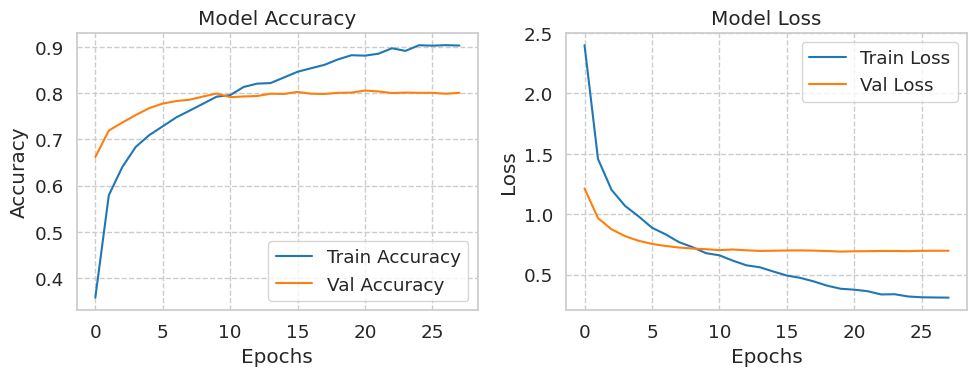

In [16]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

#### Örnek Tahminler

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


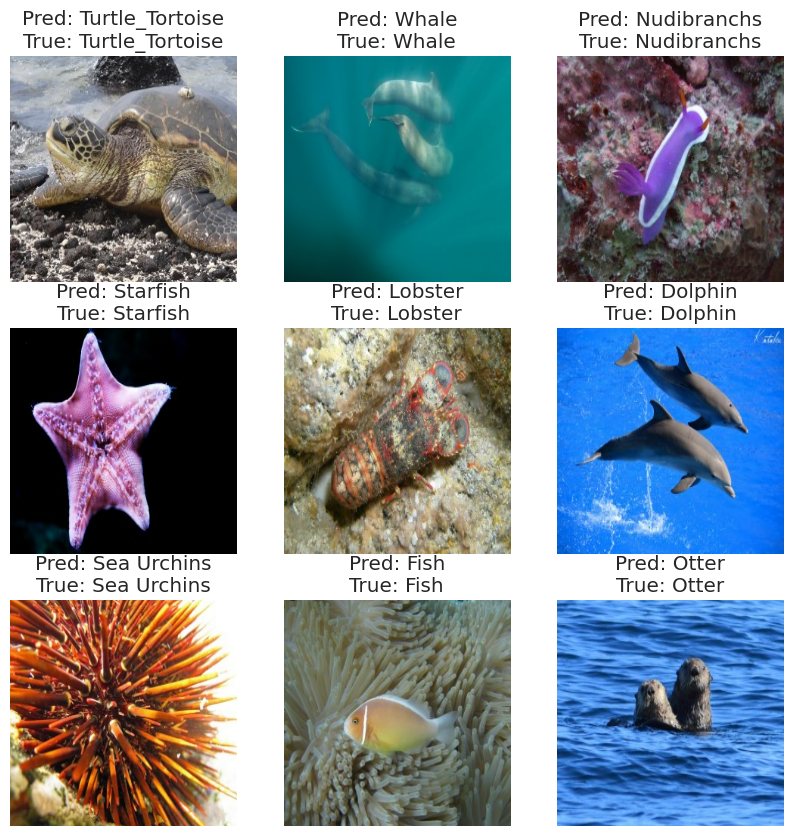

In [17]:
plt.figure(figsize=(10, 10))
class_names = list(train_ds.class_names)
for images, labels in test_ds.take(1):

    predictions = model.predict(images)

    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_label = np.argmax(predictions[i])
        true_label = labels[i]

        plt.title(f"Pred: {class_names[predicted_label]}\nTrue: {class_names[true_label]}")
        plt.axis("off")

#### Sınıflara Göre Metriklerin Elde Edilmesi ve Confusion Matrix

Classification Report:
                 precision    recall  f1-score   support

          Clams     0.5667    0.6667    0.6126        51
         Corals     0.6038    0.6275    0.6154        51
          Crabs     0.9592    0.9400    0.9495        50
        Dolphin     0.8590    0.8701    0.8645        77
            Eel     0.6000    0.7200    0.6545        50
           Fish     0.6750    0.5625    0.6136        48
     Jelly Fish     0.9405    0.9294    0.9349        85
        Lobster     0.8085    0.7451    0.7755        51
    Nudibranchs     0.6939    0.6800    0.6869        50
        Octopus     0.6047    0.4643    0.5253        56
          Otter     0.9245    0.9800    0.9515        50
        Penguin     0.8400    0.8750    0.8571        48
        Puffers     0.7647    0.7358    0.7500        53
       Sea Rays     0.7857    0.6226    0.6947        53
    Sea Urchins     0.9194    0.9828    0.9500        58
       Seahorse     0.7059    0.7500    0.7273        48
       

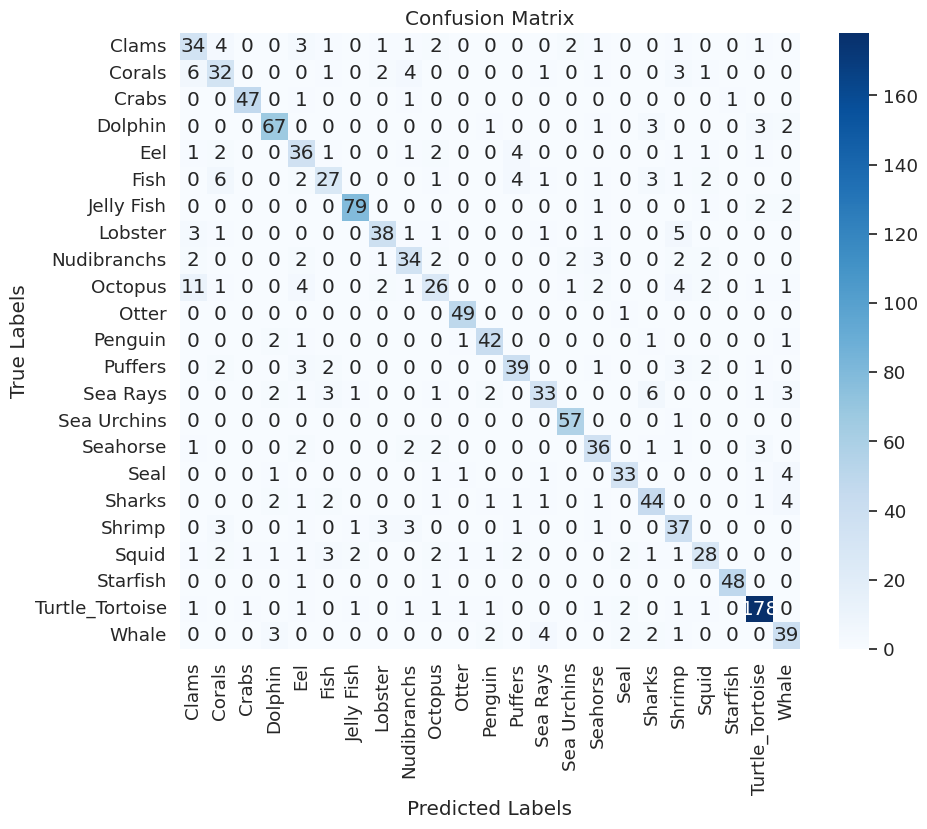

In [18]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Tüm test verisi için gerçek ve tahmin edilen etiketleri topla
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images, verbose=0)  # verbose=0 ile çıktıyı gizle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

# Sınıf isimlerini al
class_names = list(train_ds.class_names)

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Confusion Matrix'i görselleştir
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [19]:
loss, accuracy = model.evaluate(test_ds)

print("Loss:", loss)
print("Accuracy:", accuracy)

43/43 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - accuracy: 0.7945 - loss: 0.7034
Loss: 0.7038286924362183
Accuracy: 0.7887836694717407


## Sonuçların Karşılaştırılması

### Accuracy Grafiği

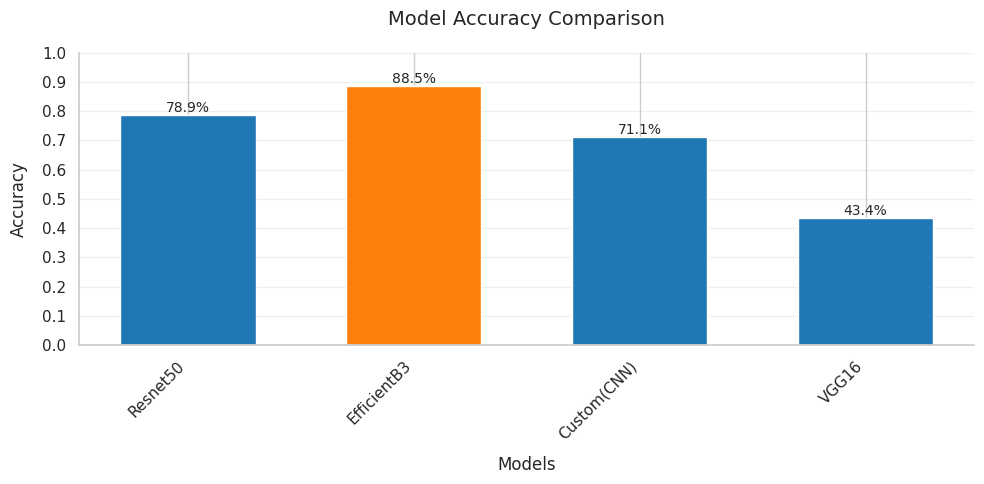

In [21]:
import matplotlib.pyplot as plt
import numpy as np

models = ["Resnet50", "EfficientB3", "Custom(CNN)", "VGG16"]
accuracies = [0.7887, 0.8853, 0.7112, 0.4340]

plt.figure(figsize=(10, 5))
plt.rcParams['font.family'] = 'sans-serif'

colors = ['#1f77b4' if acc != max(accuracies) else '#ff7f0e' for acc in accuracies]

bars = plt.bar(models, accuracies, color=colors, width=0.6)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1%}',
             ha='center', va='bottom',
             fontsize=10)

plt.title('Model Accuracy Comparison', pad=20, fontsize=14)
plt.xlabel('Models', labelpad=10)
plt.ylabel('Accuracy', labelpad=10)
plt.ylim(0, 1.0)
plt.yticks(np.arange(0, 1.1, 0.1))

plt.grid(axis='y', alpha=0.3)

plt.xticks(rotation=45, ha='right')

for spine in ['top', 'right']:
    plt.gca().spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

### Performans Metriklerinin Karşılaştırılması

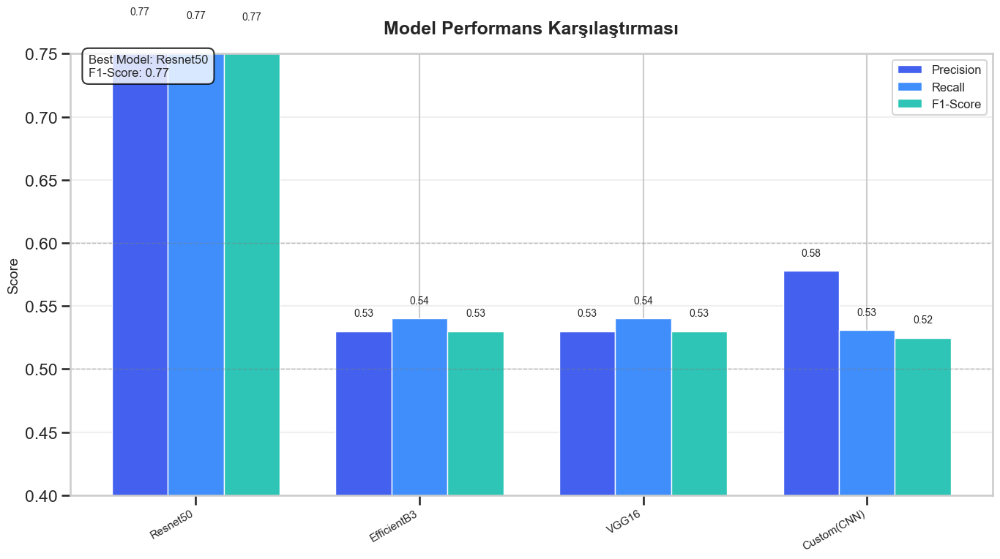

In [13]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("talk")

results = {
    'Model': ['Resnet50', 'EfficientB3', 'Custom(CNN)', 'VGG16' ],
    'Precision': [0.7692, 0.53, 0.5778, 0.53],
    'Recall': [0.7662, 0.54, 0.5309, 0.54],
    'F1-Score': [0.7654, 0.53, 0.5248, 0.53]
}

df = pd.DataFrame(results)

df = df.sort_values(by='F1-Score', ascending=False)

def create_bar_chart():
    plt.figure(figsize=(14, 8))
    ax = plt.gca()

    colors = ["#4361EE", "#3F8EFC", "#2EC4B6"]
    custom_cmap = LinearSegmentedColormap.from_list("custom", colors, N=3)

    x = np.arange(len(df['Model']))
    width = 0.25

    metric_bars = []
    for i, metric in enumerate(['Precision', 'Recall', 'F1-Score']):
        bars = ax.bar(x + (i-1)*width, df[metric], width, label=metric,
                color=custom_cmap(i/3), edgecolor='white', linewidth=1)
        metric_bars.append(bars)

    for bars in metric_bars:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{height:.2f}', ha='center', va='bottom', fontsize=10)

    ax.axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, linewidth=1)
    ax.axhline(y=0.6, color='gray', linestyle='--', alpha=0.5, linewidth=1)

    ax.set_title('Model Performans Karşılaştırması', fontsize=18, fontweight='bold', pad=20)
    ax.set_xlabel('', fontsize=12)
    ax.set_ylabel('Score', fontsize=14)
    ax.set_ylim(0.4, 0.75)
    ax.set_xticks(x)
    ax.set_xticklabels(df['Model'], rotation=30, ha='right', fontsize=11)
    ax.legend(loc='upper right', frameon=True, fontsize=12)
    ax.grid(axis='y', alpha=0.3)

    best_model_idx = df['F1-Score'].idxmax()
    best_model = df.loc[best_model_idx, 'Model']
    best_f1 = df.loc[best_model_idx, 'F1-Score']
    ax.text(0.02, 0.95, f'Best Model: {best_model}\nF1-Score: {best_f1:.2f}',
             transform=ax.transAxes, fontsize=12,
             bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5'))

    plt.tight_layout()
    plt.savefig('model_comparison_chart.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_table():
    plt.figure(figsize=(12, 6))
    ax = plt.gca()
    ax.axis('off')

    cell_text = []
    for i, row in df.iterrows():
        cell_text.append([
            row['Model'],
            f"{row['Precision']:.3f}",
            f"{row['Recall']:.3f}",
            f"{row['F1-Score']:.3f}"
        ])

    header_color = ['#e6e6e6'] * 4

    cell_colors = []
    for i, row in df.iterrows():
        row_colors = ['#f9f9f9']
        for metric in ['Precision', 'Recall', 'F1-Score']:
            val = row[metric]
            intensity = min(1.0, max(0.0, (val - 0.45) / 0.25))
            color = sns.color_palette("Blues", 12)[int(intensity * 8) + 3]
            row_colors.append(tuple(color))
        cell_colors.append(row_colors)

    table = plt.table(
        cellText=cell_text,
        colLabels=['Model', 'Precision', 'Recall', 'F1-Score'],
        cellLoc='center',
        loc='center',
        cellColours=cell_colors,
        colColours=header_color,
        bbox=[0.05, 0.05, 0.9, 0.8]
    )

    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1.2, 1.8)  # Tabloyu daha büyük ve okunabilir yap

    for (i, j), cell in table.get_celld().items():
        if i == 0:  # Başlık satırı
            cell.set_text_props(weight='bold', color='black')
            cell.set_height(0.15)
        cell.set_edgecolor('#ffffff')

    plt.title('Metriklere Göre Model Performansları', fontsize=18, fontweight='bold', pad=20)

    plt.tight_layout()
    plt.savefig('model_comparison_table.png', dpi=300, bbox_inches='tight')
    plt.show()

create_bar_chart()


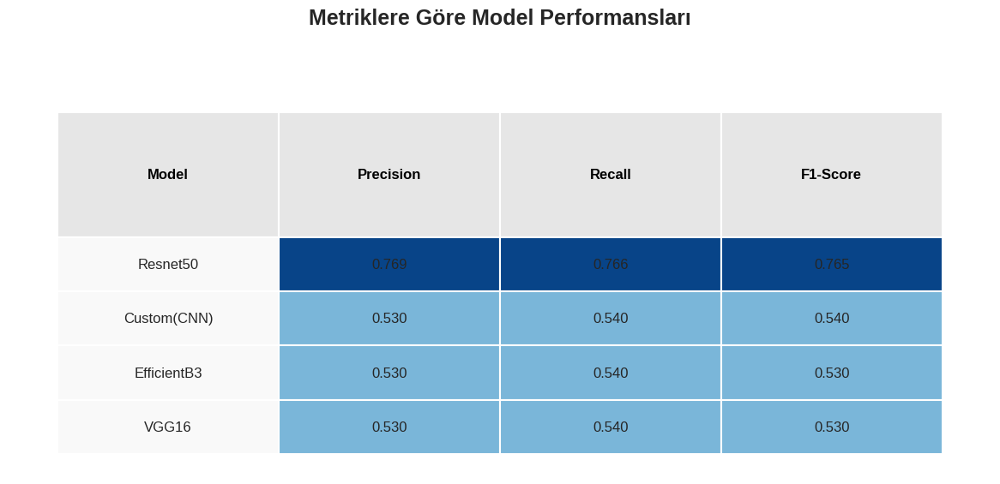

In [23]:
create_table()